# USA Real Estate(Price Prediction)

In [1]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
real_estate=pd.read_csv('realtor-data.csv')
real_estate.head()

,status,price,bed,bath,acre_lot,full_address,street,city,state,zip_code,house_size,sold_date
0,for_sale,105000.0,3.0,2.0,0.12,"Sector Yahuecas Titulo # V84, Adjuntas, PR, 00601",Sector Yahuecas Titulo # V84,Adjuntas,Puerto Rico,601.0,920.0,NaN
1,for_sale,80000.0,4.0,2.0,0.08,"Km 78 9 Carr # 135, Adjuntas, PR, 00601",Km 78 9 Carr # 135,Adjuntas,Puerto Rico,601.0,1527.0,NaN
2,for_sale,67000.0,2.0,1.0,0.15,"556G 556-G 16 St, Juana Diaz, PR, 00795",556G 556-G 16 St,Juana Diaz,Puerto Rico,795.0,748.0,NaN
3,for_sale,145000.0,4.0,2.0,0.10,"R5 Comunidad El Paraso Calle De Oro R-5 Ponce,...",R5 Comunidad El Paraso Calle De Oro R-5 Ponce,Ponce,Puerto Rico,731.0,1800.0,NaN
4,for_sale,65000.0,6.0,2.0,0.05,"14 Navarro, Mayaguez, PR, 00680",14 Navarro,Mayaguez,Puerto Rico,680.0,NaN,NaN


In [3]:
# real_estate['city'].value_counts()
# real_estate[real_estate['city']=='New York City']['city']='New York'
real_estate['city'] = real_estate['city'].replace({'New York City' : 'New York'})


In [4]:
real_estate['city'].value_counts()

New York              96163
Boston                31502
Brooklyn              23178
Bronx                 11586
Jersey City           10416
                      ...  
Riverhead                 1
Sunset Park               1
Westchester County        1
Brighton Beach            1
New Hamburg               1
Name: city, Length: 2541, dtype: int64

In [5]:
real_estate.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 923159 entries, 0 to 923158
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   status        923159 non-null  object 
 1   price         923088 non-null  float64
 2   bed           791456 non-null  float64
 3   bath          807967 non-null  float64
 4   acre_lot      649536 non-null  float64
 5   full_address  923159 non-null  object 
 6   street        921021 non-null  object 
 7   city          923085 non-null  object 
 8   state         923159 non-null  object 
 9   zip_code      922954 non-null  float64
 10  house_size    625316 non-null  float64
 11  sold_date     456396 non-null  object 
dtypes: float64(6), object(6)
memory usage: 84.5+ MB


In [6]:
# missing value

real_estate.isnull().sum()

status               0
price               71
bed             131703
bath            115192
acre_lot        273623
full_address         0
street            2138
city                74
state                0
zip_code           205
house_size      297843
sold_date       466763
dtype: int64

In [7]:
# check for duplicate values

real_estate.duplicated().sum()

809370

In [8]:
#drop duplicated values 

real_estate.drop_duplicates(inplace=True)

In [9]:
real_estate.isnull().sum()

status              0
price              18
bed             17516
bath            16297
acre_lot        31123
full_address        0
street            511
city               23
state               0
zip_code           33
house_size      36448
sold_date       54092
dtype: int64

In [10]:
real_estate.drop(['sold_date','full_address'],axis=1, inplace=True)

real_estate.dropna(subset=["city","zip_code","price",'street'],inplace=True)

#giving median(numerical value) data input to missing data so not to drop lot of data

real_estate['bed'] = real_estate['bed'].fillna(real_estate['bed'].median())
real_estate['bath'] = real_estate['bath'].fillna(real_estate['bath'].median())
real_estate['acre_lot'] = real_estate['acre_lot'].fillna(real_estate['acre_lot'].median())
real_estate['house_size'] = real_estate['house_size'].fillna(real_estate['house_size'].median())

In [11]:
real_estate.isnull().sum()

status        0
price         0
bed           0
bath          0
acre_lot      0
street        0
city          0
state         0
zip_code      0
house_size    0
dtype: int64

In [12]:
real_estate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 113221 entries, 0 to 923147
Data columns (total 10 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   status      113221 non-null  object 
 1   price       113221 non-null  float64
 2   bed         113221 non-null  float64
 3   bath        113221 non-null  float64
 4   acre_lot    113221 non-null  float64
 5   street      113221 non-null  object 
 6   city        113221 non-null  object 
 7   state       113221 non-null  object 
 8   zip_code    113221 non-null  float64
 9   house_size  113221 non-null  float64
dtypes: float64(6), object(4)
memory usage: 9.5+ MB


In [13]:
# remove special characters from street columns  
real_estate['street'] = real_estate['street'].str.replace (r"""[^\w\s]+""","")

/tmp/ipykernel_15156/261723682.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  real_estate['street'] = real_estate['street'].str.replace (r"""[^\w\s]+""","")


In [14]:
real_estate.describe() 

,price,bed,bath,acre_lot,zip_code,house_size
count,1.132210e+05,113221.000000,113221.000000,113221.000000,113221.000000,1.132210e+05
mean,9.042238e+05,3.262319,2.446649,12.998780,8263.796301,2.002799e+03
std,3.412838e+06,1.713531,1.612279,838.963358,4585.860053,4.835530e+03
min,0.000000e+00,1.000000,1.000000,0.000000,601.000000,1.000000e+02
25%,2.500000e+05,2.000000,2.000000,0.150000,6010.000000,1.376000e+03
50%,4.499000e+05,3.000000,2.000000,0.260000,8005.000000,1.664000e+03
75%,7.999900e+05,4.000000,3.000000,0.570000,10301.000000,2.034000e+03
max,8.750000e+08,123.000000,198.000000,100000.000000,99999.000000,1.450112e+06


In [15]:
real_estate.head()

,status,price,bed,bath,acre_lot,street,city,state,zip_code,house_size
0,for_sale,105000.0,3.0,2.0,0.12,Sector Yahuecas Titulo V84,Adjuntas,Puerto Rico,601.0,920.0
1,for_sale,80000.0,4.0,2.0,0.08,Km 78 9 Carr 135,Adjuntas,Puerto Rico,601.0,1527.0
2,for_sale,67000.0,2.0,1.0,0.15,556G 556G 16 St,Juana Diaz,Puerto Rico,795.0,748.0
3,for_sale,145000.0,4.0,2.0,0.10,R5 Comunidad El Paraso Calle De Oro R5 Ponce,Ponce,Puerto Rico,731.0,1800.0
4,for_sale,65000.0,6.0,2.0,0.05,14 Navarro,Mayaguez,Puerto Rico,680.0,1664.0


#VISUALIZATION

/home/hhklab/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


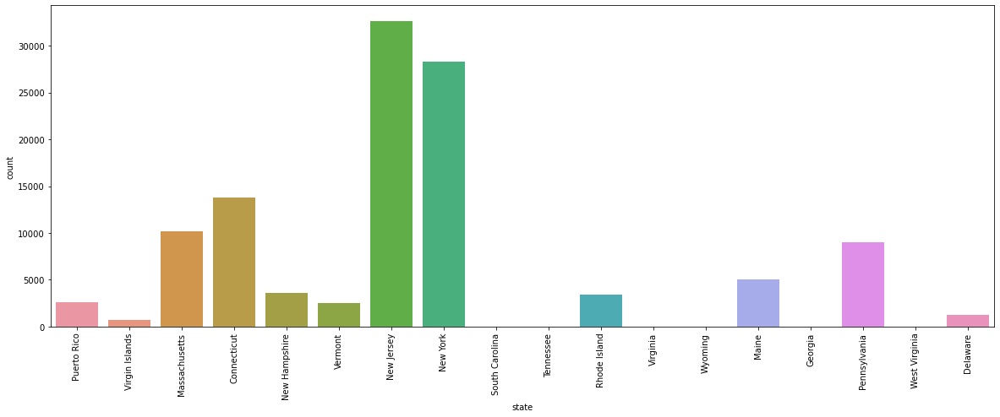

In [16]:
plt.figure(figsize=(20,7))
sns.countplot(real_estate['state'])
plt.xticks(rotation=90)
plt.show()

Text(0.5, 1.0, 'The relation between number of baths and price')

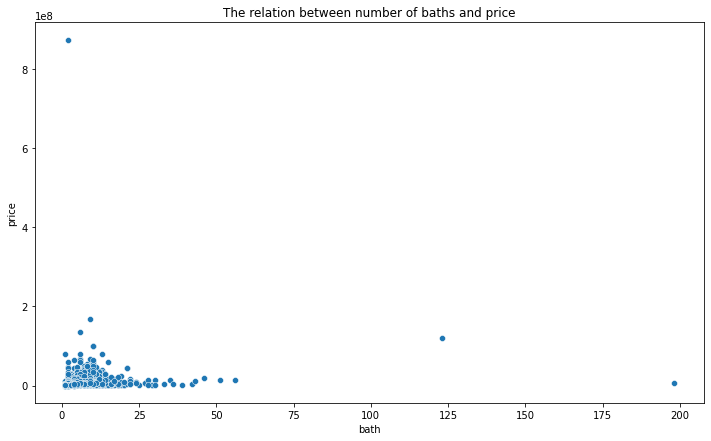

In [17]:
plt.figure(figsize=(12,7))
sns.scatterplot(data=real_estate,x="bath",y="price")
plt.title("The relation between number of baths and price")

Text(0.5, 1.0, 'The relation between number of Beds and price')

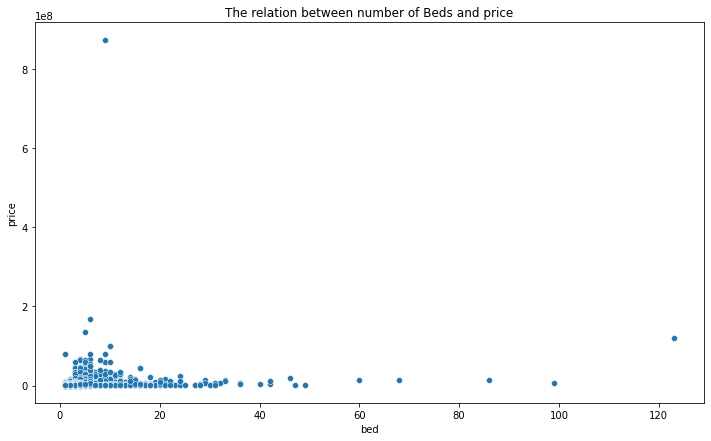

In [18]:
plt.figure(figsize=(12,7))

sns.scatterplot(data=real_estate,x="bed",y="price")
plt.title("The relation between number of Beds and price")

In [19]:
from plotly.offline import iplot, init_notebook_mode
import plotly.express as px
fig = px.scatter(real_estate, x="house_size", y="price", trendline="ols", color='price', title='Total Square Feet and its Price')
fig.show()


In [20]:
fig = px.imshow(real_estate.corr())
fig.show()

In [21]:
#converting categorical features
from sklearn.preprocessing import LabelEncoder
for col in real_estate.columns:
    if real_estate[col].dtype == 'object':
        values = real_estate[col].value_counts()
        values = dict(values)
        
        label = LabelEncoder()
        label = label.fit(real_estate[col])
        real_estate[col] = label.transform(real_estate[col].astype(str))
        
        new_values = real_estate[col].value_counts()
        new_values = dict(new_values)
        
        value_dict = {}
        i=0
        for key in values:
            value_dict[key] = list(new_values)[i]
            i+= 1

In [22]:
real_estate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 113221 entries, 0 to 923147
Data columns (total 10 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   status      113221 non-null  int64  
 1   price       113221 non-null  float64
 2   bed         113221 non-null  float64
 3   bath        113221 non-null  float64
 4   acre_lot    113221 non-null  float64
 5   street      113221 non-null  int64  
 6   city        113221 non-null  int64  
 7   state       113221 non-null  int64  
 8   zip_code    113221 non-null  float64
 9   house_size  113221 non-null  float64
dtypes: float64(6), int64(4)
memory usage: 9.5 MB


In [25]:
#standard scalar
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [26]:


#model training
Y=real_estate[['price']]
X=real_estate.drop(['price'],axis=1)
X = scaler.fit_transform(X)
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.4,random_state=101)

# Linear Regression
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
lr.fit(X_train,Y_train)
predictions= lr.predict(X_test)

#error
from sklearn import metrics
print(f'mean absolute error: {metrics.mean_absolute_error(Y_test,predictions)}')
print(f"mean squared error : {metrics.mean_squared_error(Y_test,predictions)}")
print(f"Root mean squared error : {np.sqrt(metrics.mean_squared_error(Y_test,predictions))}")

#Decision Tree Regression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error

DTR=DecisionTreeRegressor()
DTR.fit(X_train,Y_train)
Pred=DTR.predict(X_test)
print(mean_squared_error(Y_test,Pred))

# Random Forest
from sklearn.ensemble import RandomForestRegressor

RFR=RandomForestRegressor()
RFR.fit(X_train,Y_train)
Pred_=RFR.predict(X_test)
print(mean_squared_error(Y_test,Pred_))

mean absolute error: 691843.1277561068
mean squared error : 3526783557895.167
Root mean squared error : 1877973.258035153
36354844272229.016


/tmp/ipykernel_15156/1739441146.py:33: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



2744706098956.5425
